In [173]:
# Import necessary libraries
from IPython.display import HTML, display
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import glob
import json
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm
from datetime import datetime
import glob
import seaborn as sns
import re
import os


import nltk
# nltk.download()
from nltk.sentiment import SentimentIntensityAnalyzer
from nltk.corpus import stopwords
from nltk import sent_tokenize, word_tokenize
from wordcloud import WordCloud, STOPWORDS

from collections import Counter
from nltk.tokenize import RegexpTokenizer
nltk.download('punkt')
nltk.download('vader_lexicon')

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/manoharguvvu/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/manoharguvvu/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [155]:
# Get a list of all CSV files in the specified directory
files = [i for i in glob.glob('../input/*.{}'.format('csv'))]

# Initialize an empty list to store DataFrames
dfs = list()

# Iterate through each CSV file and read it into a DataFrame
for csv in files:
    df = pd.read_csv(csv)
    # Add a 'country' column based on the country code extracted from the file path
    df['country'] = csv[9:11]
    # Append the DataFrame to the list of DataFrames
    dfs.append(df)
    
# Concatenate all DataFrames into a single DataFrame
my_df = pd.concat(dfs)

# Drop rows with any NaN values
my_df = my_df.dropna()

# Drop rows where 'likes' is NaN
my_df.dropna(subset=['likes'], inplace=True)

# Convert the 'view_count' column to integers
to_int = ['view_count']
for column in to_int:
    my_df[column] = my_df[column].astype(int)
    

# Create a DataFrame with the most viewed thumbnails
most_views_thumb = my_df
most_views_thumb = most_views_thumb.drop_duplicates('video_id',keep='last').sort_values('view_count',ascending=False)
most_views_thumb = most_views_thumb['thumbnail_link'].head(100).reset_index()['thumbnail_link']

# Define the number of rows and columns for thumbnail display
ROW = 10
COLUMN = 10
tempHTML = ''
innerHTML = '<div style="block">'
    
for r in range(ROW):
    rowHTML = ''
    for c in range(COLUMN):
        #if c != COLUMN-1:
        tempHTML = '<img src="' + most_views_thumb[c*10+r] + '"style="float:left;width:80px;height:80px;margin:0">'
        rowHTML += tempHTML
        #else:
            #tempHTML = '<img src="' + most_views_thumb[c*10+r] + '"style="float:left;width:80px;height:80px;margin:0">'
            #rowHTML += tempHTML
    innerHTML += rowHTML #'<div>' +rowHTML + '</div>'
    
# Close the HTML div tag
innerHTML += '</div>'

# Display the HTML code in the notebook
display(HTML(innerHTML))

In [156]:
# Get a list of all CSV files in the specified directory and sort them
files = [i for i in glob.glob('../input/*.{}'.format('csv'))]
sorted(files)

# Initialize an empty list to store DataFrames
dfs = list()

# Iterate through each CSV file and read it into a DataFrame
for csv in files:
    df = pd.read_csv(csv)
    
    # Fill NaN values in the 'categoryId' column with -1
    df['categoryId'].fillna(-1, inplace=True)
    
    # Append the DataFrame to the list of DataFrames
    dfs.append(df)

# Concatenate all DataFrames into a single DataFrame
my_df = pd.concat(dfs)

# Drop rows where 'trending_date' is NaN
my_df = my_df.dropna(subset=['trending_date'])

# Get the length of the resulting DataFrame
num_rows = len(my_df)
num_rows


97224

In [157]:
import datetime

# Function to clean the 'publishedAt' timestamp
def clean_publish_time(time):
    date_part, time_part = time.split('T')
    y, m, d = date_part.split('-')
    
    # Create a datetime.date object for the publish date
    publish_date = datetime.date(int(y), int(m), int(d))
    
    # Extract the time part from 'publishedAt'
    publish_time = time_part.split('Z')[0]
    
    return publish_date, publish_time

# Function to clean the 'trending_date' timestamp
def clean_trending_date(date):
    # Handle the case when 'trending_date' is 'nan'
    if date == 'nan':
        return datetime.date(2023, 9, 9)
    
    # Convert the date to a string and extract year, month, and day
    date_str = str(date)
    y, m, d = date_str.split('T')[0].split('-')
    
    # Create a datetime.date object for the trending date
    return datetime.date(int(y), int(m), int(d))

# Apply the cleaning functions to the 'trending_date' and 'publishedAt' columns
my_df['trending_date'] = my_df['trending_date'].apply(clean_trending_date)
my_df['publish_date'], my_df['publish_time'] = zip(*my_df['publishedAt'].apply(clean_publish_time))

# Create a full DataFrame with duplicates removed based on 'video_id'
my_df_full = my_df.reset_index().sort_values('trending_date').set_index('video_id')

# Create a DataFrame with duplicates removed based on 'video_id' keeping the last entry
my_df = my_df.reset_index().sort_values('trending_date').drop_duplicates('video_id', keep='last').set_index('video_id')

# Display the first few rows of the cleaned DataFrame
my_df.head()


,index,title,publishedAt,channelId,channelTitle,categoryId,trending_date,tags,view_count,likes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,country,publish_date,publish_time
video_id,,,,,,,,,,,,,,,,,,
8PZfs8kdsMk,173,Resumen y Goles | San Luis vs Mazatlán | Liga ...,2023-09-23T04:48:25Z,UCq8BPLXtFeiSFOvmJrknWGg,LIGA BBVA MX,17.0,2023-10-01,[None],60638.0,497.0,23.0,https://i.ytimg.com/vi/8PZfs8kdsMk/default.jpg,False,False,San Luis volvió a tomar el liderato después de...,MX,2023-09-23,04:48:25
QW0HfUdl8Os,188,¡América es el nuevo líder gracias a Valdés y ...,2023-09-21T04:26:33Z,UCUf4RLsG_TsjinvtL2jT-VA,FOX Sports MX,17.0,2023-10-01,Liga MX|Apertura 2023|Querétaro|América,904981.0,8891.0,834.0,https://i.ytimg.com/vi/QW0HfUdl8Os/default.jpg,False,False,RESUMEN: Querétaro 1-2 América | Liga MX | Ape...,MX,2023-09-21,04:26:33
j-oahijIw-U,218,"El Bogueto - PRI - Dj Rockwell, Uzielito Mix, ...",2023-09-18T23:00:11Z,UC-6lK20fJE_YVW_nshsDwaA,El Bogueto,10.0,2023-10-01,Bogueto|El bogueto|Uzielito mix|Pri|Reggaetoñe...,571052.0,16918.0,11605.0,https://i.ytimg.com/vi/j-oahijIw-U/default.jpg,False,False,“Pri” segundo tema de Reggaetoñerito Prod - DJ...,MX,2023-09-18,23:00:11
AgZKxqgGNfg,213,DESBLOQUEO LA NUEVA PETSHOP en Avatar World *N...,2023-09-20T18:38:07Z,UCa7bWqdjazbwMGUgpme35tw,Sol Games,20.0,2023-10-01,#TocaBoca,331179.0,6809.0,1051.0,https://i.ytimg.com/vi/AgZKxqgGNfg/default.jpg,False,False,NaN,MX,2023-09-20,18:38:07
7Oc8sfj_Ybk,219,EMPIEZO el MODO CARRERA de FC 24 con ESTE EQUI...,2023-09-19T17:12:17Z,UCi7TVXyvrIwqeS9tfYD8UDA,DjMaRiiO,20.0,2023-10-01,djmariio|djmario|djmarrio|djmarioo|dj|mario|ma...,1524108.0,117027.0,2720.0,https://i.ytimg.com/vi/7Oc8sfj_Ybk/default.jpg,False,False,MODO CARRERA EA SPORTS FC 24 PS5 GAMEPLAY➜TikT...,MX,2023-09-19,17:12:17


In [158]:
# Create a new DataFrame 'fre_df' by grouping 'my_df_full' by 'video_id' and 'country',
# counting the number of occurrences, sorting in descending order, and resetting the index
fre_df = pd.DataFrame(my_df_full.groupby([my_df_full.index, 'country']).count()['title'].sort_values(ascending=False)).reset_index()

# Display the first few rows of the DataFrame 'fre_df'
fre_df.head()

# Display the last few rows of the DataFrame 'fre_df'
fre_df.tail()


,video_id,country,title
20393,Pt0gH4H_NQw,MX,1
20394,PrYBaNfqbu4,MX,1
20395,PmnS4IO5wLs,IN,1
20396,r2eO1DtuLH4,RU,1
20397,NJS2AbfBiIg,RU,1


In [159]:
# Convert 'categoryId' column to string type
my_df['categoryId'] = my_df['categoryId'].astype(str)
# my_df_full['categoryId'] = my_df['categoryId'].astype(str)

# Create a dictionary to map category IDs to category titles
category_id = {}
with open('../input/US_category_id.json', 'r') as f:
    data = json.load(f)
    for category in data['items']:
        category_id[int(category['id'])] = category['snippet']['title']

# Convert 'categoryId' column to numeric, fill NaN values with -1, and then to integer
my_df['categoryId'] = pd.to_numeric(my_df['categoryId'], errors='coerce')
my_df['categoryId'].fillna(-1, inplace=True)
my_df['categoryId'] = my_df['categoryId'].astype(int)

# Map category IDs to category titles and insert the 'category' column at index 4
my_df.insert(4, 'category', my_df['categoryId'].map(category_id))
# # my_df_full.insert(4, 'category', my_df_full['categoryId'].map(category_id))

# Get unique category titles from the 'category' column
category_list = my_df['category'].unique()
category_list


array(['Sports', 'Music', 'Gaming', 'Entertainment', 'People & Blogs',
       'Science & Technology', 'Education', 'Howto & Style',
       'Autos & Vehicles', 'Comedy', 'News & Politics',
       'Film & Animation', 'Nonprofits & Activism', 'Travel & Events',
       'Pets & Animals'], dtype=object)

In [160]:
my_df.head()

,index,title,publishedAt,channelId,category,channelTitle,categoryId,trending_date,tags,view_count,likes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,country,publish_date,publish_time
video_id,,,,,,,,,,,,,,,,,,,
8PZfs8kdsMk,173,Resumen y Goles | San Luis vs Mazatlán | Liga ...,2023-09-23T04:48:25Z,UCq8BPLXtFeiSFOvmJrknWGg,Sports,LIGA BBVA MX,17,2023-10-01,[None],60638.0,497.0,23.0,https://i.ytimg.com/vi/8PZfs8kdsMk/default.jpg,False,False,San Luis volvió a tomar el liderato después de...,MX,2023-09-23,04:48:25
QW0HfUdl8Os,188,¡América es el nuevo líder gracias a Valdés y ...,2023-09-21T04:26:33Z,UCUf4RLsG_TsjinvtL2jT-VA,Sports,FOX Sports MX,17,2023-10-01,Liga MX|Apertura 2023|Querétaro|América,904981.0,8891.0,834.0,https://i.ytimg.com/vi/QW0HfUdl8Os/default.jpg,False,False,RESUMEN: Querétaro 1-2 América | Liga MX | Ape...,MX,2023-09-21,04:26:33
j-oahijIw-U,218,"El Bogueto - PRI - Dj Rockwell, Uzielito Mix, ...",2023-09-18T23:00:11Z,UC-6lK20fJE_YVW_nshsDwaA,Music,El Bogueto,10,2023-10-01,Bogueto|El bogueto|Uzielito mix|Pri|Reggaetoñe...,571052.0,16918.0,11605.0,https://i.ytimg.com/vi/j-oahijIw-U/default.jpg,False,False,“Pri” segundo tema de Reggaetoñerito Prod - DJ...,MX,2023-09-18,23:00:11
AgZKxqgGNfg,213,DESBLOQUEO LA NUEVA PETSHOP en Avatar World *N...,2023-09-20T18:38:07Z,UCa7bWqdjazbwMGUgpme35tw,Gaming,Sol Games,20,2023-10-01,#TocaBoca,331179.0,6809.0,1051.0,https://i.ytimg.com/vi/AgZKxqgGNfg/default.jpg,False,False,NaN,MX,2023-09-20,18:38:07
7Oc8sfj_Ybk,219,EMPIEZO el MODO CARRERA de FC 24 con ESTE EQUI...,2023-09-19T17:12:17Z,UCi7TVXyvrIwqeS9tfYD8UDA,Gaming,DjMaRiiO,20,2023-10-01,djmariio|djmario|djmarrio|djmarioo|dj|mario|ma...,1524108.0,117027.0,2720.0,https://i.ytimg.com/vi/7Oc8sfj_Ybk/default.jpg,False,False,MODO CARRERA EA SPORTS FC 24 PS5 GAMEPLAY➜TikT...,MX,2023-09-19,17:12:17


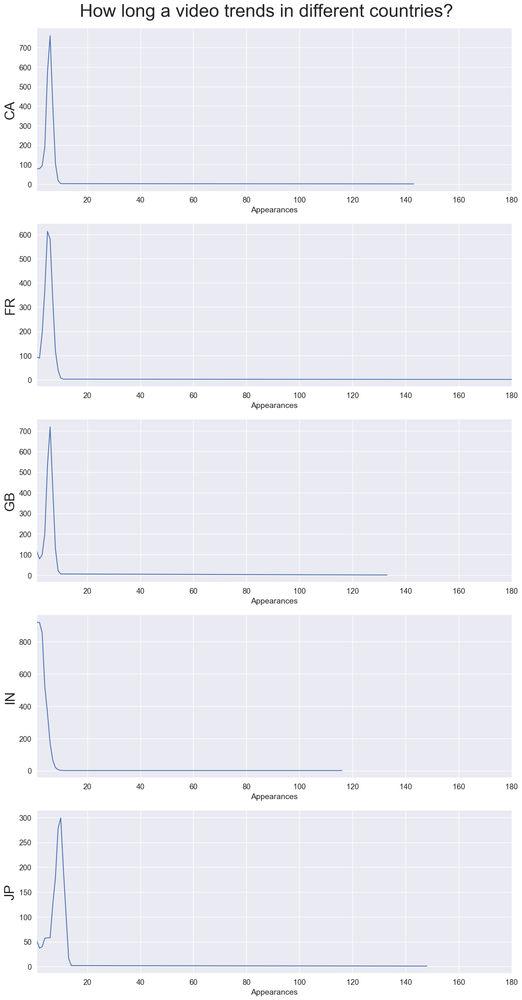

In [161]:
# Initialize lists to store video counts and maximum video appearances for each country
video_list, max_list = list(), list()

# Get a list of unique countries from the DataFrame
country_list = my_df.groupby(['country']).count().index

# Iterate over each country to collect video counts and maximum video appearances
for c in country_list:
    video_list.append(fre_df[fre_df['country'] == c]['title'].value_counts().sort_index())
    max_list.append(max(fre_df[fre_df['country'] == c]['title'].value_counts().sort_index().index))

# Create subplots with 5 rows and a shared x-axis
fig, [ax0, ax1, ax2, ax3, ax4] = plt.subplots(nrows=5, figsize=(15, 30))

# Set the overall title for the subplots
st = fig.suptitle("How long a video trends in different countries?", fontsize=32)
st.set_y(0.9)

# Plot the video counts for each country
for i, pt in enumerate([ax0, ax1, ax2, ax3, ax4]):
    pt.plot(video_list[i].index, video_list[i])
    pt.spines['right'].set_visible(False)
    pt.spines['top'].set_visible(False)
    pt.set_xlabel("Appearances", fontsize=14)
    pt.set_ylabel(country_list[i], fontsize=24)
    pt.axes.set_xlim(1, max(max_list))

# Tweak spacing between subplots to prevent labels from overlapping
plt.subplots_adjust(hspace=0.2)
plt.subplots_adjust(wspace=0)


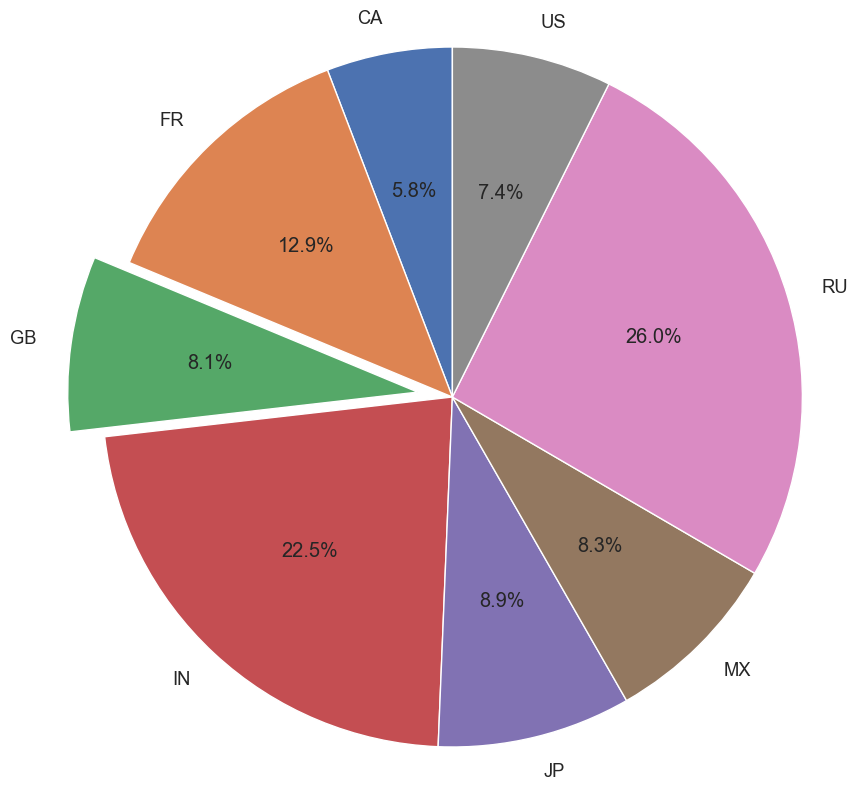

country
CA     950
FR    2112
GB    1323
IN    3686
JP    1462
MX    1359
RU    4255
US    1207
Name: title, dtype: int64

In [162]:
# Get unique countries and their corresponding video counts
labels = my_df.groupby(['country']).count().index
sizes = my_df.groupby(['country']).count()['title']

# Define the 'explode' parameter to emphasize a specific slice (e.g., the third slice)
explode = (0, 0, 0, 0.1, 0)  # Only "explode" the 4th slice (index 3)

# Determine the number of countries
num_countries = len(labels)

# Create a list of zeros for 'explode'
explode = [0] * num_countries

# Adjust the index 2 to 'explode' the third slice
explode[2] = 0.1

# Create a pie chart
fig, ax = plt.subplots(figsize=(10, 10))
ax.pie(sizes, labels=labels, autopct='%1.1f%%',
       shadow=False, explode=explode, startangle=90)

# Ensure an equal aspect ratio for a circular pie chart
ax.axis('equal')

# Display the pie chart
plt.show()

# Display the sizes (number of videos) for each country
sizes


IndexError: list index out of range

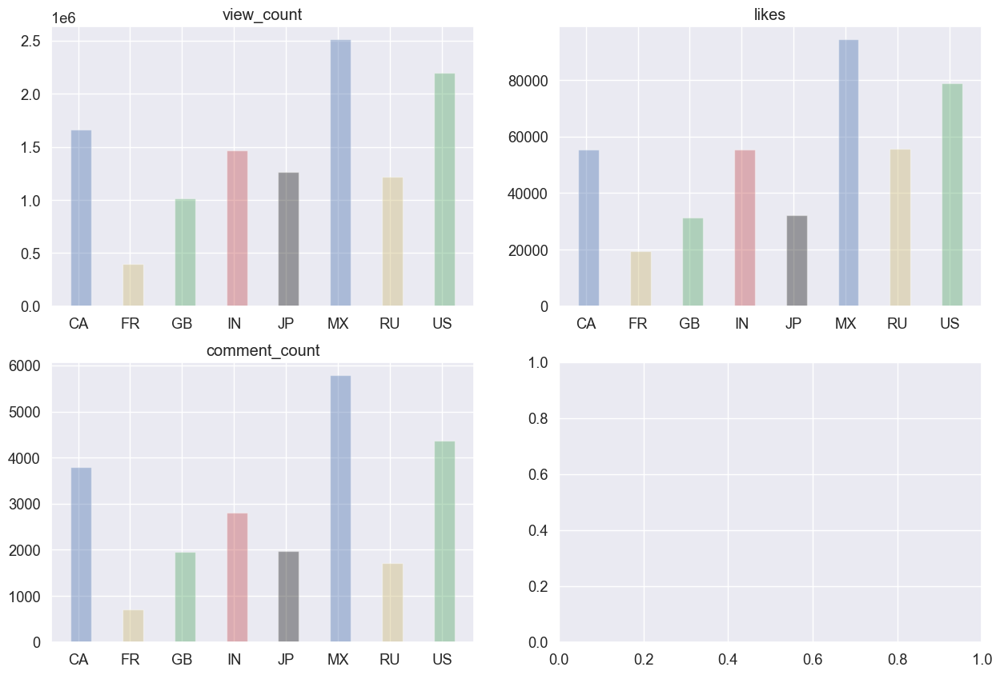

In [163]:
# Convert specified columns to integer type
to_int = ['view_count', 'likes', 'comment_count']
for column in to_int:
    my_df[column] = my_df[column].astype(int)

# Initialize a list to store aggregated measures for each country and column
measures = list()
n_groups = len(country_list)

# Iterate over each column and calculate the average measure for each country
for i, typ in enumerate(to_int):
    measure = list()
    for c in country_list:
        # Calculate the average measure for each country
        measure.append(my_df[my_df['country']==c][typ].agg('sum') / len(my_df[my_df['country']==c].index.unique()))
    measures.append(measure)

# Create subplots with two rows and two columns
fig, [[ax1, ax2], [ax3, ax4]] = plt.subplots(ncols=2, nrows=2, figsize=(15, 10))

# Set up parameters for bar plots
index = np.arange(n_groups)
bar_width = 0.1
opacity = 0.4
error_config = {'ecolor': '0.3'}

# Iterate over each pair of axes
for i, axs in enumerate([[ax1, ax2], [ax3, ax4]]):
    for j, ax in enumerate(axs):
        # Plot the bar chart for each measure
        ax.bar(index + (bar_width), measures[(i+j)+i], bar_width*4,
                alpha=opacity, color=['b', 'y', 'g', 'r', 'k'],
                error_kw=error_config)
        # Set the title for each subplot based on the measure
        ax.set_title(to_int[(i+j)+i])
        ax.set_xticks(index + bar_width / 2)
        ax.set_xticklabels(country_list)


In [164]:
# Create a DataFrame 'corr_list' with unique video IDs as the index
corr_list = pd.DataFrame(fre_df['video_id'].unique(), columns=['video_id'])

# Initialize columns for each country and a 'total' column
for country_code in fre_df['country'].unique():
    corr_list[country_code] = 0
corr_list['total'] = 0

# Set the 'video_id' as the index for 'corr_list'
corr_list = corr_list.set_index('video_id')

# Iterate over each unique video ID
for index, item in corr_list.iterrows():
    total = 0  # Initialize the total count for the current video ID
    
    # Iterate over rows in 'fre_df' corresponding to the current video ID
    for i, row in fre_df[fre_df['video_id'] == index][['country', 'title']].iterrows():
        total += row['title']  # Update the total count
        corr_list.loc[[index], [row['country']]] = row['title']  # Update the count for the specific country
        
    corr_list.loc[[index], ['total']] = total  # Update the 'total' column for the current video ID

# Display the first few rows of 'corr_list'
corr_list.head()


,FR,RU,MX,JP,CA,GB,US,IN,total
video_id,,,,,,,,,
#NAME?,180,174,162,148,143,133,121,116,1177
3ryID_SwU5E,6,4,12,10,8,7,37,3,87
mwKJfNYwvm8,4,3,12,0,9,7,29,1,65
3OFj6l2tQ9s,7,4,14,10,9,7,28,4,83
KrLj6nc516A,0,0,0,0,0,0,21,0,21


/var/folders/w8/q35p830s6lbg7f097b_4s4wh0000gn/T/ipykernel_16350/168810378.py:29: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(labels, minor=False, fontsize=15)
/var/folders/w8/q35p830s6lbg7f097b_4s4wh0000gn/T/ipykernel_16350/168810378.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, minor=False, fontsize=15)


,CA,FR,GB,IN,JP,US,MX,RU
CA,1.000000,0.328024,0.636280,0.194705,0.153542,0.755960,0.225158,0.302414
FR,0.328024,1.000000,0.257846,0.200430,0.187545,0.232159,0.240961,0.378257
GB,0.636280,0.257846,1.000000,0.159581,0.135169,0.567310,0.195555,0.275945
IN,0.194705,0.200430,0.159581,1.000000,0.120512,0.129002,0.145941,0.304798
JP,0.153542,0.187545,0.135169,0.120512,1.000000,0.126713,0.147941,0.251010
US,0.755960,0.232159,0.567310,0.129002,0.126713,1.000000,0.236039,0.244354
MX,0.225158,0.240961,0.195555,0.145941,0.147941,0.236039,1.000000,0.285341
RU,0.302414,0.378257,0.275945,0.304798,0.251010,0.244354,0.285341,1.000000


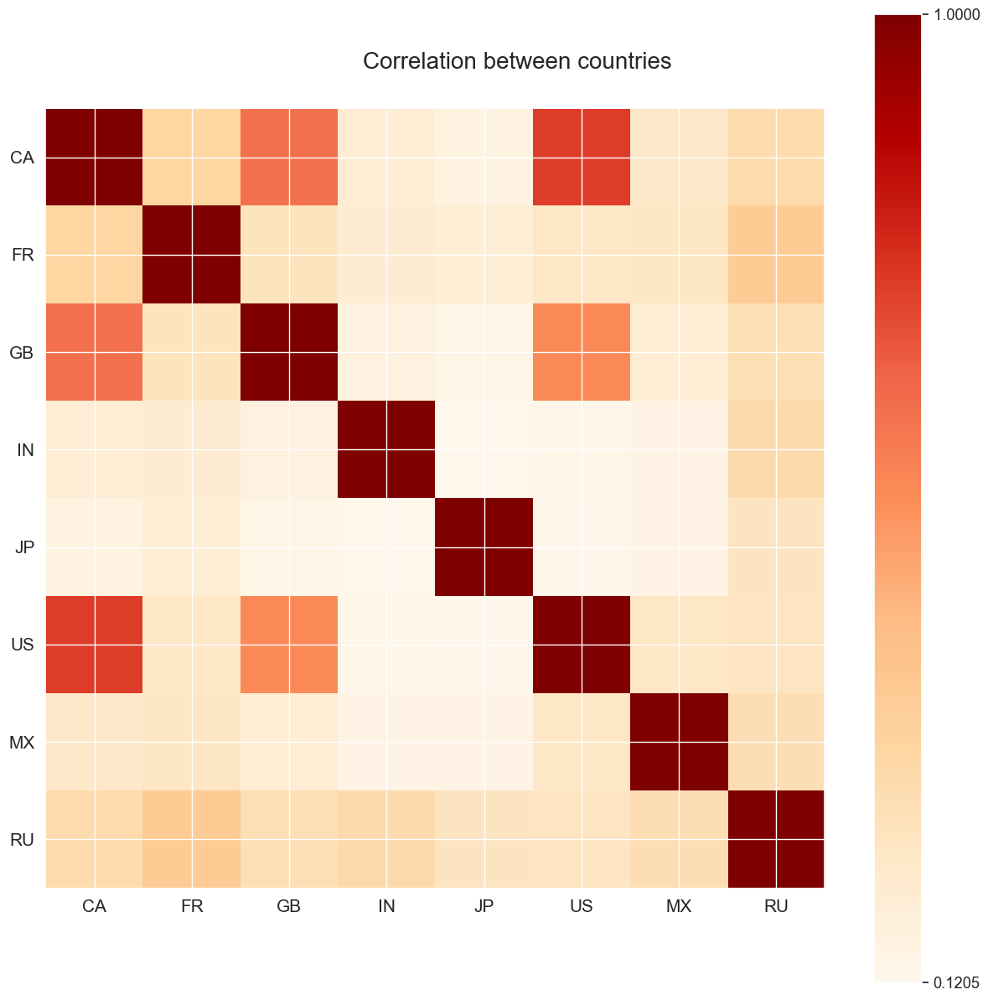

In [165]:
# List of countries for which correlations will be analyzed
countries = ['CA', 'FR', 'GB', 'IN', 'JP', 'US', 'MX', 'RU']

# Extract the subset of the correlation matrix for the specified countries
corr_matrix = corr_list[countries].corr()

# Create a figure and axis for the heatmap
fig, ax = plt.subplots(figsize=(15, 15))

# Set the title for the heatmap
fig.suptitle('Correlation between countries', fontsize=20).set_y(0.85)

# Create a heatmap using the correlation matrix
heatmap = ax.imshow(corr_matrix, interpolation='nearest', cmap=cm.OrRd)

# Determine the colorbar limits
cbar_min = corr_matrix.min().min()
cbar_max = corr_matrix.max().max()

# Create the colorbar on the side
cbar = fig.colorbar(heatmap, ticks=[cbar_min, cbar_max])

# Create labels for countries
labels = ['']
for column in countries:
    labels.append(column)

# Set tick labels for both axes
ax.set_yticklabels(labels, minor=False, fontsize=15)
ax.set_xticklabels(labels, minor=False, fontsize=15)

# Display the correlation matrix
corr_matrix


/var/folders/w8/q35p830s6lbg7f097b_4s4wh0000gn/T/ipykernel_16350/3295556370.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='count', y='category', data=cat_df, orient='h', palette='husl', ax=axes[i])
/var/folders/w8/q35p830s6lbg7f097b_4s4wh0000gn/T/ipykernel_16350/3295556370.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='count', y='category', data=cat_df, orient='h', palette='husl', ax=axes[i])
/var/folders/w8/q35p830s6lbg7f097b_4s4wh0000gn/T/ipykernel_16350/3295556370.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='c

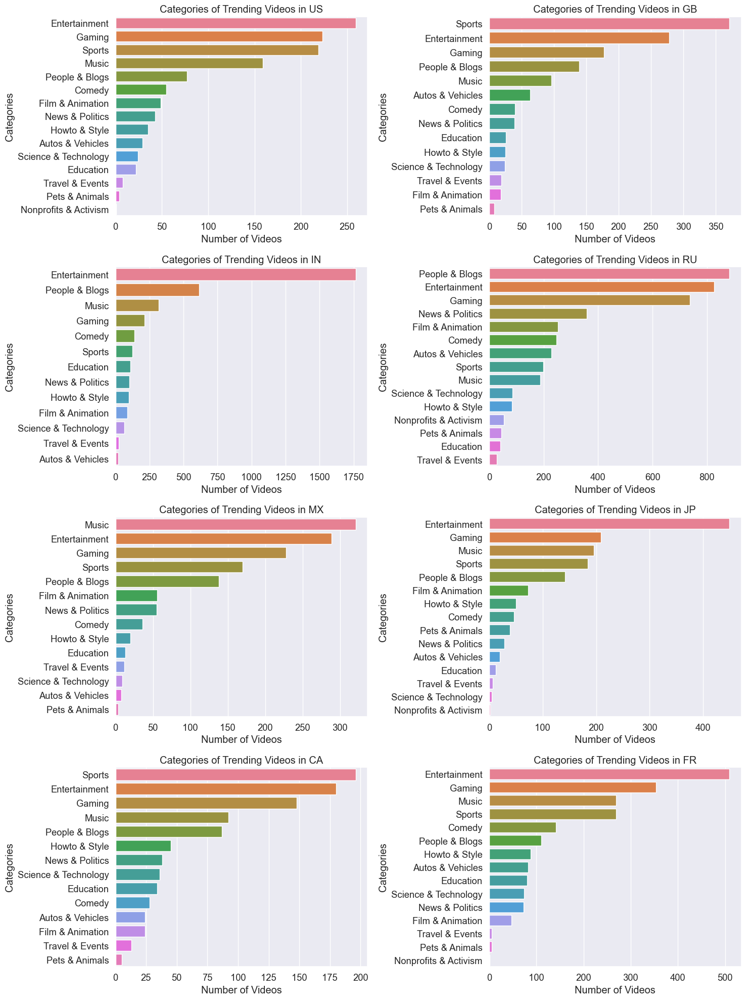

In [166]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of countries
countries = ['US', 'GB', 'IN', 'RU', 'MX', 'JP', 'CA', 'FR']  # Add or modify as per your dataset

# Create a 4x2 subplot grid
fig, axes = plt.subplots(4, 2, figsize=(15, 20))
axes = axes.flatten()  # Flatten the array for easy iteration

# Iterate over each country and plot
for i, country in enumerate(countries):
    # Filter and prepare the data for each country
    cat_df = my_df[my_df['country'] == country]['category'].value_counts().reset_index()
    
    # Create a barplot for each country
    sns.barplot(x='count', y='category', data=cat_df, orient='h', palette='husl', ax=axes[i])
    axes[i].set_title(f'Categories of Trending Videos in {country}')
    axes[i].set_xlabel('Number of Videos')
    axes[i].set_ylabel('Categories')

# Adjust layout
plt.tight_layout()
plt.show()


In [167]:
import math

# Create an empty dictionary to store publish-to-trend durations
publish_to_trend = {}

# Extract the first occurrence of each video
my_df_first = my_df_full.reset_index().drop_duplicates('video_id', keep='first').set_index('video_id')

# Calculate the time duration from publish to trend for the first occurrence
diff_first = (my_df_first['trending_date']).astype('datetime64[s]') - my_df_first['publish_date'].astype('datetime64[s]')

# Reset the index and rename columns for clarity
diff_first = diff_first.reset_index()
diff_first.columns = ['video_id', 'publish_to_trend']

# Populate the 'publish_to_trend' dictionary with video IDs and their corresponding durations
for i, row in diff_first.iterrows():
    publish_to_trend[row['video_id']] = row['publish_to_trend'].days

# Extract the last occurrence of each video
my_df_last = my_df

# Calculate the time duration from publish to trend for the last occurrence
diff_last = my_df['trending_date'].astype('datetime64[s]') - my_df['publish_date'].astype('datetime64[s]')

# Reset the index and rename columns for clarity
diff_last = diff_last.reset_index()
diff_last.columns = ['video_id', 'publish_to_trend_last']

# Insert new columns into the DataFrame to store the calculated durations
my_df.insert(4, 'publish_to_trend_last_7', diff_last['publish_to_trend_last'].astype('timedelta64[s]').astype(int))
my_df.insert(4, 'publish_to_trend_7', my_df['video_id'].map(publish_to_trend))
my_df.insert(4, 'trend_duration_in_days_7', 0)

# Calculate the trend duration in days for the last 7 days
my_df['trend_duration_in_days_7'] = ((my_df['publish_to_trend_last'] - my_df['publish_to_trend']) / 86400) + 1

# Display a subset of the DataFrame with selected columns, sorted by trend duration in descending order
my_df.set_index('video_id')[['publish_to_trend', 'trend_duration_in_days_7']].sort_values('trend_duration_in_days_7', ascending=False).head()


KeyError: 'video_id'

<Axes: xlabel='ratio', ylabel='category'>

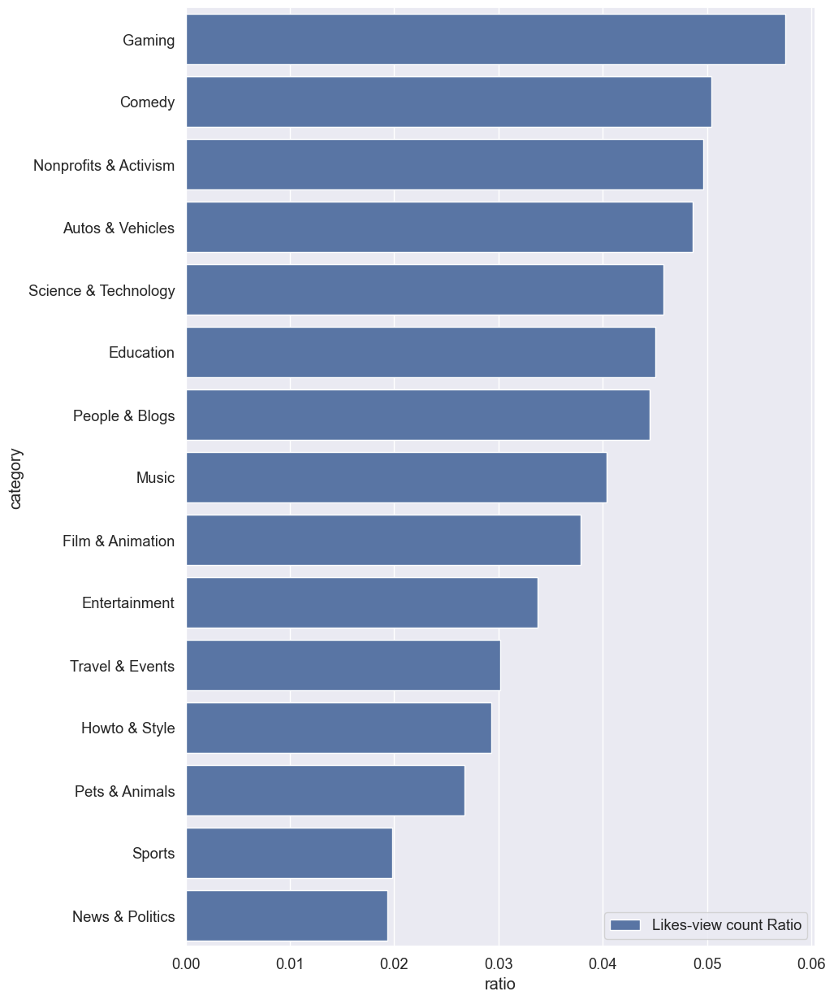

In [169]:
# Calculate the likes-to-view count ratio for each category
like_view_count_ratio = my_df.groupby('category')['likes'].agg('sum') / my_df.groupby('category')['view_count'].agg('sum')

# Sort the ratios in descending order and reset the index
like_view_count_ratio = like_view_count_ratio.sort_values(ascending=False).reset_index()

# Rename columns for clarity
like_view_count_ratio.columns = ['category', 'ratio']

# Create a bar plot to visualize the likes-to-view count ratio
plt.subplots(figsize=(10, 15))
sns.barplot(x="ratio", y="category", data=like_view_count_ratio,
            label="Likes-view count Ratio", color="b")


<Axes: xlabel='ratio', ylabel='category'>

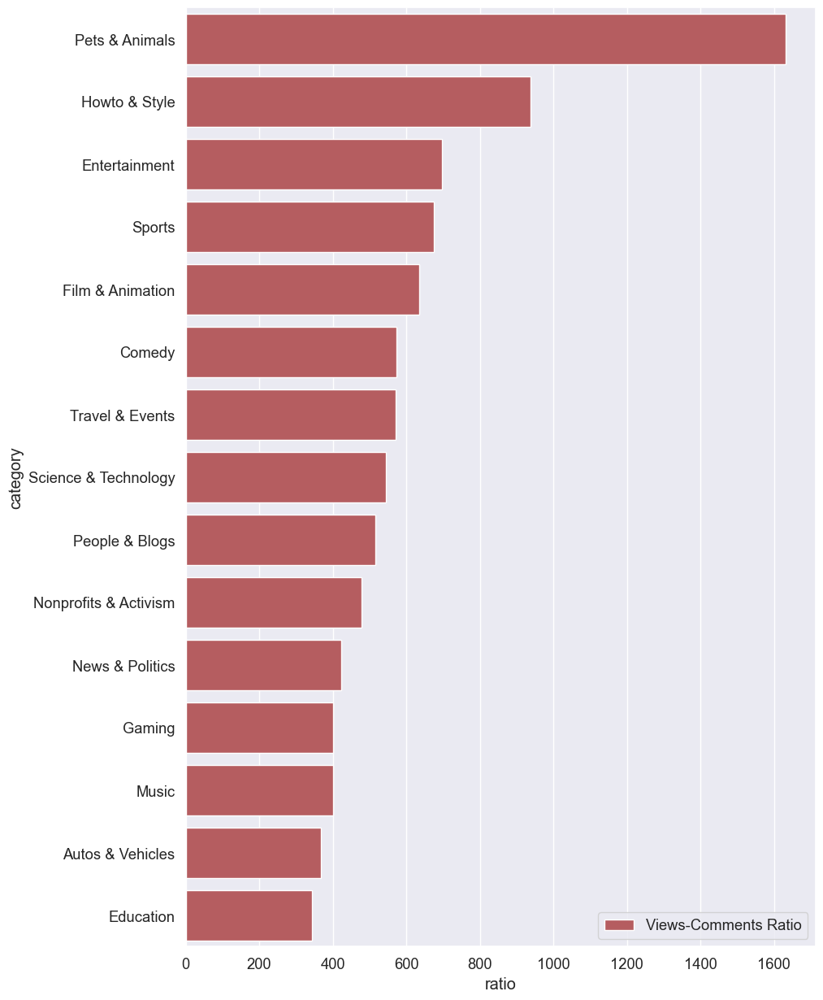

In [170]:
# Calculate the views-to-comment count ratio for each category
views_comment_ratio = my_df.groupby('category')['view_count'].agg('sum') / my_df.groupby('category')['comment_count'].agg('sum')

# Sort the ratios in descending order and reset the index
views_comment_ratio = views_comment_ratio.sort_values(ascending=False).reset_index()

# Rename columns for clarity
views_comment_ratio.columns = ['category', 'ratio']

# Create a bar plot to visualize the views-to-comment count ratio
plt.subplots(figsize=(10, 15))
sns.barplot(x="ratio", y="category", data=views_comment_ratio,
            label="Views-Comments Ratio", color="r")


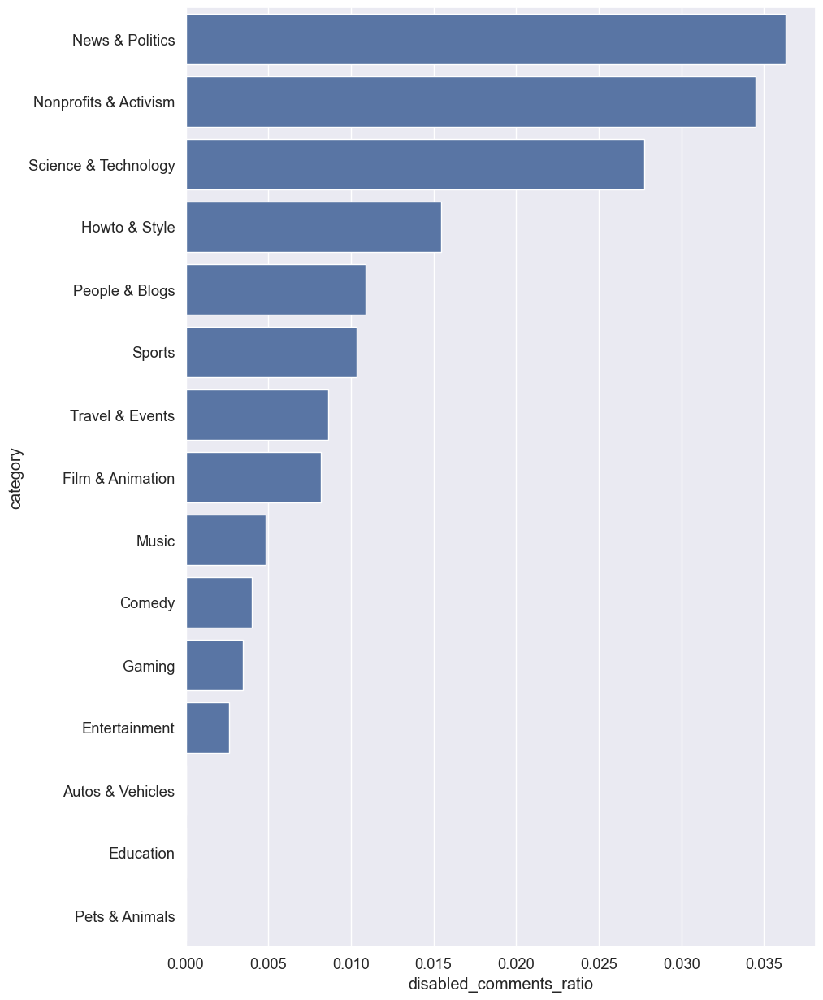

In [171]:
# Count of videos with comments disabled per category
disabled_comments_count = my_df.groupby('category')['comments_disabled'].sum()

# Total number of videos per category
total_videos_count = my_df.groupby('category').size()

# Calculate the ratio of videos with disabled comments
comments_disabled_ratio = disabled_comments_count / total_videos_count

# Sorting, resetting index, and renaming columns
comments_disabled_ratio = comments_disabled_ratio.sort_values(ascending=False).reset_index()
comments_disabled_ratio.columns = ['category', 'disabled_comments_ratio']

# Plotting
plt.subplots(figsize=(10, 15))
sns.barplot(x="disabled_comments_ratio", y="category", data=comments_disabled_ratio, color="b")
plt.show()


/var/folders/w8/q35p830s6lbg7f097b_4s4wh0000gn/T/ipykernel_16350/2010215904.py:51: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=tags_sentiment['polarity'], y=tags_sentiment['category'], data=tags_sentiment, orient='h', palette="RdBu")


Text(0.5, 1.0, 'Polarity of Categories in Youtube Videos')

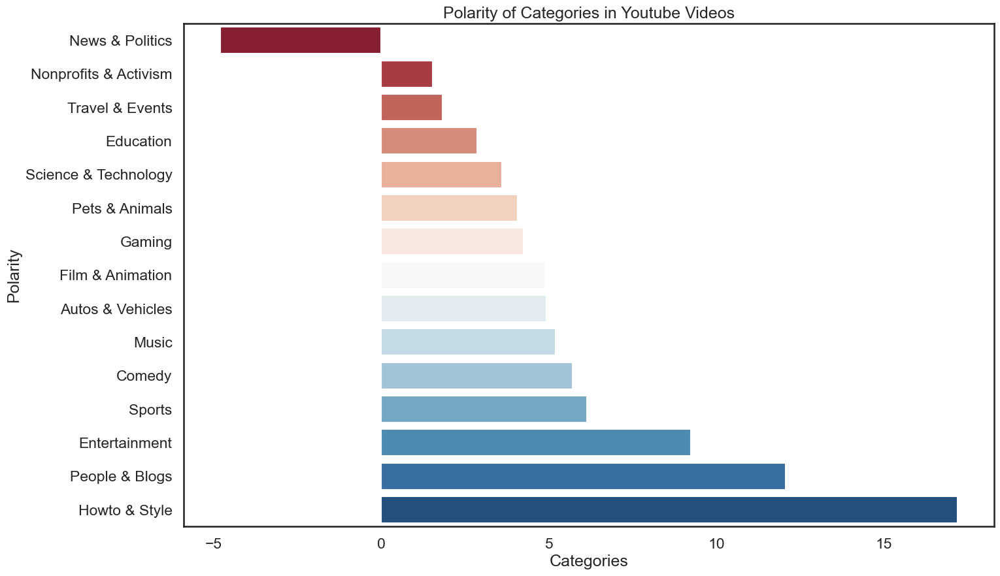

In [174]:
MAX_N = 1000

# Define and combine stopwords for English, German, and French
en_stopwords = list(stopwords.words('english'))
de_stopwords = list(stopwords.words('german'))
fr_stopwords = list(stopwords.words('french'))
en_stopwords.extend(de_stopwords)
en_stopwords.extend(fr_stopwords)

# Create an empty list to store polarities
polarities = list()

# Iterate through each category in the category list
for cate in category_list:
    # Concatenate all tags for the current category into a single string
    tags_word = my_df[my_df['category'] == cate]['tags'].str.lower().str.cat(sep=' ')

    # Remove punctuation, numbers, and stopwords from the concatenated tags
    tags_word = re.sub('[^A-Za-z]+', ' ', tags_word)
    word_tokens = word_tokenize(tags_word)
    filtered_sentence = [w for w in word_tokens if not w in en_stopwords]
    without_single_chr = [word for word in filtered_sentence if len(word) > 2]
    cleaned_data_title = [word for word in without_single_chr if not word.isdigit()]

    # Calculate frequency distribution of cleaned tags
    word_dist = nltk.FreqDist(cleaned_data_title)
    hnhk = pd.DataFrame(word_dist.most_common(MAX_N), columns=['Word', 'Frequency'])

    # Calculate compound polarity for each word in the top MAX_N words
    compound = .0
    for word in hnhk['Word'].head(MAX_N):
        compound += SentimentIntensityAnalyzer().polarity_scores(word)['compound']

    # Append the compound polarity to the polarities list
    polarities.append(compound)

# Create DataFrames for category list and polarities
category_list = pd.DataFrame(category_list)
polarities = pd.DataFrame(polarities)

# Concatenate the DataFrames to create a final DataFrame
tags_sentiment = pd.concat([category_list, polarities], axis=1)
tags_sentiment.columns = ['category', 'polarity']

# Sort the DataFrame by polarity values and reset the index
tags_sentiment = tags_sentiment.sort_values('polarity').reset_index()

# Plotting
plt.figure(figsize=(16, 10))
sns.set(style="white", context="talk")
ax = sns.barplot(x=tags_sentiment['polarity'], y=tags_sentiment['category'], data=tags_sentiment, orient='h', palette="RdBu")
plt.xlabel("Categories")
plt.ylabel("Polarity")
plt.title("Polarity of Categories in Youtube Videos")


In [175]:
def wcloud(data, bgcolor):
    # Create a figure with a specified size
    plt.figure(figsize=(20, 15))

    # Create a WordCloud object with specified parameters
    cloud = WordCloud(background_color=bgcolor, max_words=100, max_font_size=50)

    # Generate the word cloud from the input data
    cloud.generate(' '.join(data))

    # Display the word cloud image
    plt.imshow(cloud)

    # Turn off axis labels
    plt.axis('off')


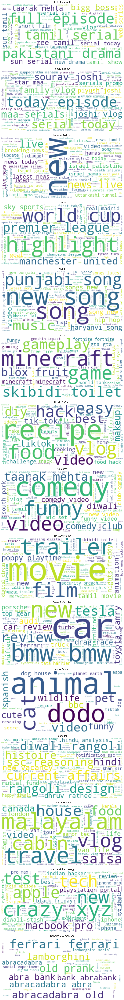

In [176]:
# List of categories - replace with your actual categories
categories = ['Entertainment', 'People & Blogs', 'News & Politics', 'Sports',
       'Music', 'Gaming', 'Howto & Style', 'Comedy', 'Film & Animation',
       'Autos & Vehicles', 'Pets & Animals', 'Education',
       'Travel & Events', 'Science & Technology', 'Nonprofits & Activism']

# Prepare data for each category
category_data = {}

# Iterate through each category
for category in categories:
    # Concatenate all tags for the current category into a single string
    tags_word = my_df[my_df['category'] == category]['tags'].str.lower().str.cat(sep=' ')
    
    # Remove non-alphabetic characters
    tags_word = re.sub('[^A-Za-z]+', ' ', tags_word)
    
    # Tokenize the words
    word_tokens = word_tokenize(tags_word)
    
    # Remove stopwords
    filtered_sentence = [w for w in word_tokens if not w in en_stopwords]
    
    # Remove single-character words
    without_single_chr = [word for word in filtered_sentence if len(word) > 2]
    
    # Remove numeric words
    cleaned_data = [word for word in without_single_chr if not word.isdigit()]
    
    # Remove 'none' and None values
    cleaned_data_without_none = [word for word in cleaned_data if word is not None and word != 'none']
    
    # Store the cleaned data for the category
    category_data[category] = ' '.join(cleaned_data_without_none)

# Create a 5x3 grid of subplots
fig, axes = plt.subplots(15, 1, figsize=(100, 100))
axes = axes.flatten()

# Generate and plot word clouds for each category
for i, category in enumerate(categories):
    ax = axes[i]
    wordcloud = WordCloud(background_color='white').generate(category_data[category])
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(category)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


/var/folders/w8/q35p830s6lbg7f097b_4s4wh0000gn/T/ipykernel_16350/4032115194.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=channel_freq.index, y=channel_freq.values, alpha=0.8, palette="rocket")
/opt/homebrew/opt/ipython/libexec/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 2349 (\N{DEVANAGARI LETTER BHA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/opt/ipython/libexec/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Matplotlib currently does not support Devanagari natively.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/opt/ipython/libexec/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 2366 (\N{DEVANAGARI VOWEL SIGN AA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/o

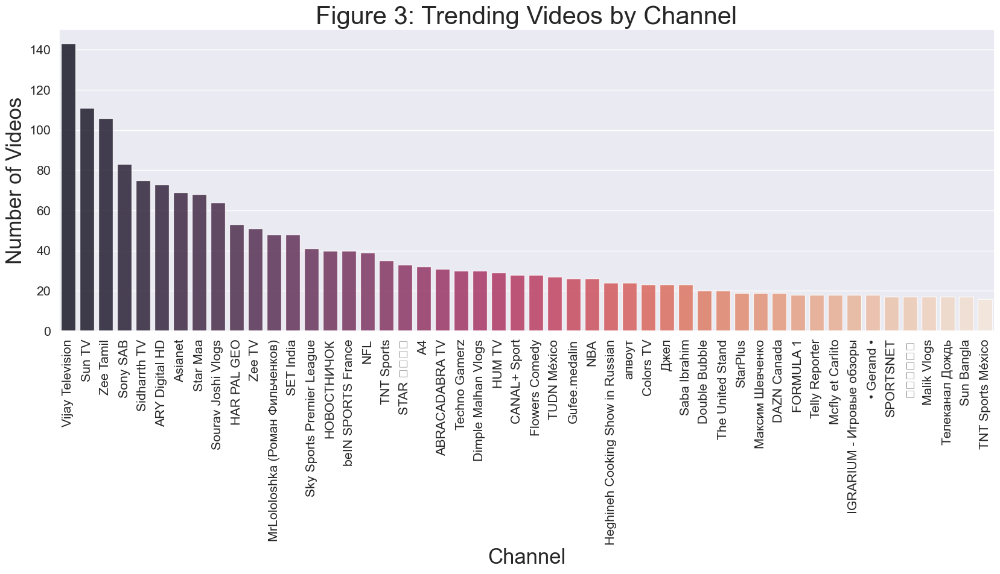

In [178]:
# Set Seaborn style and font scale
sns.set_style("darkgrid")
sns.set(font_scale=1.4)

# Get the frequency of each channel in the dataset
channel_freq = my_df['channelTitle'].value_counts()

# Select the top 50 channels based on video frequency
channel_freq = channel_freq[0:50]

# Create a bar graph for the number of videos for the top 50 channels
plt.figure(figsize=(20, 6.5))
sns.barplot(x=channel_freq.index, y=channel_freq.values, alpha=0.8, palette="rocket")

# Rotate x-axis labels for better visibility
plt.xticks(rotation=90)

# Set labels and title
plt.xlabel('Channel', fontsize=25)
plt.ylabel('Number of Videos', fontsize=25)
plt.title('Figure 3: Trending Videos by Channel', fontsize=30)

# Display the plot
plt.show()
